In [3]:
import os
import time
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from tqdm import tqdm
from tensorflow.keras import layers

2024-02-21 09:37:07.216386: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-21 09:37:07.216504: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-21 09:37:07.348665: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [5]:
batch_size = 128

train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/kaggle/input/anime-faces/anime_images/images', label_mode = None, 
    image_size = (64, 64), batch_size = batch_size
)

train_dataset = train_dataset.map(lambda x: (x / 127.5) - 1)

Found 63565 files belonging to 1 classes.


In [ ]:
plt.figure(figsize = (12, 8))

for images in train_dataset.take(1):
    for i in range(25):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(images[i].numpy())
        plt.axis('off')

Image_shape (64, 64, 3)


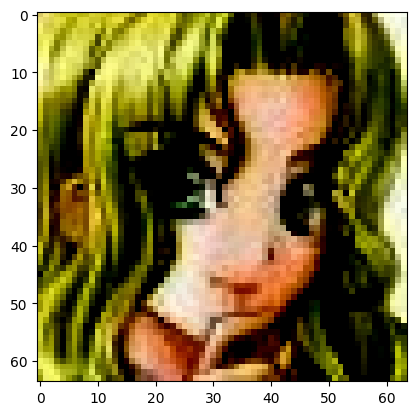

In [7]:
for batch in train_dataset:
    plt.imshow(batch[0])
    print('Image_shape', batch[0].shape)
    break

In [8]:
init_weights_kernel = tf.keras.initializers.RandomNormal(mean = 0.0, stddev = 0.02)

In [9]:
def generator_model():
    model = tf.keras.Sequential()

    model.add(layers.Input(shape = (100, )))
    model.add(layers.Dense(4 * 4 * 256))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    model.add(layers.Reshape((4, 4, 256)))
    
    model.add(layers.Conv2DTranspose(128, kernel_size=4, padding='same', strides=2, kernel_initializer=init_weights_kernel , use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    
    model.add(layers.Conv2DTranspose(64, kernel_size=4, padding='same', strides=2, kernel_initializer=init_weights_kernel, use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    
    model.add(layers.Conv2DTranspose(32, kernel_size=4, padding='same', strides=2, kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Conv2DTranspose(3, kernel_size=4, padding='same', strides=2, activation='tanh', kernel_initializer=init_weights_kernel, use_bias=False))
   
    return model

In [10]:
generator = generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 4096)              413696    
                                                                 
 batch_normalization (Batch  (None, 4096)              16384     
 Normalization)                                                  
                                                                 
 re_lu (ReLU)                (None, 4096)              0         
                                                                 
 reshape (Reshape)           (None, 4, 4, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 8, 8, 128)         524288    
 anspose)                                                        
                                                                 
 batch_normalization_1 (Bat  (None, 8, 8, 128)         5

/opt/conda/lib/python3.10/site-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


In [11]:
noise = tf.random.normal((1, 100))

generated_image = generator(noise, training=False)

generated_image.shape

TensorShape([1, 64, 64, 3])

In [12]:
def discriminator_model():
    model = tf.keras.Sequential()

    model.add(layers.Conv2D(32, kernel_size=3, strides=2, input_shape=(64, 64, 3), padding='same', kernel_initializer = init_weights_kernel, use_bias = False ))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(64, kernel_size=3, strides=2, padding='same', kernel_initializer=init_weights_kernel, use_bias=False))
    model.add(layers.ZeroPadding2D(padding=((0, 1), (0, 1))))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.25))
    
    model.add(layers.Conv2D(128, kernel_size=3, strides=2, padding='same', kernel_initializer=init_weights_kernel, use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(256, kernel_size=3, strides=1, padding='same', kernel_initializer=init_weights_kernel, use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))

    return model


In [13]:
discriminator = discriminator_model()

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 32)        864       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 32)        0         
                                                                 
 dropout (Dropout)           (None, 32, 32, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        18432     
                                                                 
 zero_padding2d (ZeroPaddin  (None, 17, 17, 64)        0         
 g2D)                                                            
                                                                 
 batch_normalization_4 (Bat  (None, 17, 17, 64)        256       
 chNormalization)                                     

In [14]:
output = discriminator(generated_image)
print(output)

tf.Tensor([[0.5000005]], shape=(1, 1), dtype=float32)


In [15]:
bce = tf.keras.losses.BinaryCrossentropy()

In [24]:
def discriminator_loss(real_output, fake_output):
    real_loss = bce(tf.ones_like(real_output), real_output)
    fake_loss = bce(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    gen_loss = bce(tf.ones_like(fake_output), fake_output)
    return gen_loss

In [25]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

In [26]:
checkpoint_dir = './training_checkpoint'
checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(
    generator_optimizer=generator_optimizer,
    discriminator_optimizer=discriminator_optimizer,
    generator=generator,
    discriminator=discriminator
)

In [27]:
epochs = 50
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal((num_examples_to_generate, noise_dim))

In [28]:
def generate_and_plot_images(model, epoch, test_input):
    predictions = model(test_input, training = False)
    fig = plt.figure(figsize = (8, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)  
        plt.imshow((predictions[i, :, :, :] * 0.5 + 0.5))
        plt.axis('off')
    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

In [29]:
@tf.function
def train_step(images):
    noise = tf.random.normal((batch_size, noise_dim))

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training = True)

        real_output = discriminator(images, training = True)
        fake_output = discriminator(generated_images, training = True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
        
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return (gen_loss, disc_loss, tf.reduce_mean(real_output), tf.reduce_mean(fake_output))

In [30]:
def train(dataset, epochs):
    
    gen_loss_list = []
    disc_loss_list = []
    
    real_score_list = []
    fake_score_list = []

    for epoch in tqdm(range(epochs)):
        start = time.time()
        num_batches = len(dataset)
        
        print(f'Training started with  epoch {epoch + 1} with {num_batches} batches..')
        
        total_gen_loss = 0
        total_disc_loss = 0
        
        for batch in dataset:
            generator_loss, discriminator_loss, real_score, fake_score = train_step(batch)
            
            total_gen_loss += generator_loss
            total_disc_loss += discriminator_loss
        
        mean_gen_loss = total_gen_loss / num_batches
        mean_disc_loss = total_disc_loss / num_batches
           
        print('Losses after epoch %5d: generator %.3f, discriminator %.3f,\
               real_score %.2f%%, fake_score %.2f%%'  %
              (epoch+1, generator_loss, discriminator_loss, real_score * 100, fake_score * 100))

        generate_and_plot_images(generator, epoch + 1, seed)                 

        gen_loss_list.append(mean_gen_loss)
        disc_loss_list.append(mean_disc_loss)
        real_score_list.append(real_score)
        fake_score_list.append(fake_score)

        if (epoch + 1) % 10 == 0:
              checkpoint.save(file_prefix = checkpoint_prefix)

        print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time() - start))

  
    return  gen_loss_list, disc_loss_list, real_score_list, fake_score_list

  0%|          | 0/50 [00:00<?, ?it/s]

Training started with  epoch 1 with 497 batches..


2024-02-21 09:42:35.056145: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_1/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1708508557.280564     158 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Losses after epoch     1: generator 3.667, discriminator 0.266,               real_score 90.72%, fake_score 9.51%
Time for epoch 1 is 61.71452832221985 sec
Training started with  epoch 2 with 497 batches..
Losses after epoch     2: generator 3.064, discriminator 0.499,               real_score 85.16%, fake_score 15.02%


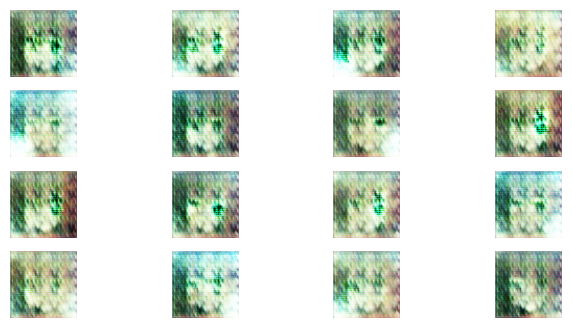

  4%|▍         | 2/50 [01:29<33:34, 41.98s/it]

Time for epoch 2 is 28.162198305130005 sec
Training started with  epoch 3 with 497 batches..
Losses after epoch     3: generator 2.384, discriminator 0.566,               real_score 88.09%, fake_score 22.83%


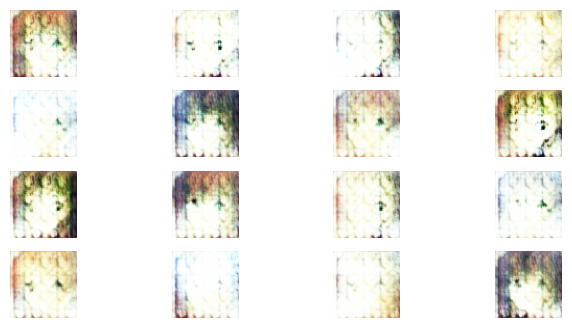

  6%|▌         | 3/50 [01:53<26:12, 33.46s/it]

Time for epoch 3 is 23.32235550880432 sec
Training started with  epoch 4 with 497 batches..
Losses after epoch     4: generator 5.270, discriminator 0.083,               real_score 96.82%, fake_score 3.40%


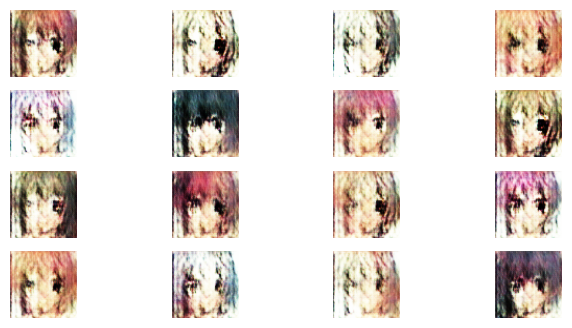

  8%|▊         | 4/50 [02:11<21:09, 27.60s/it]

Time for epoch 4 is 18.60570192337036 sec
Training started with  epoch 5 with 497 batches..
Losses after epoch     5: generator 2.694, discriminator 0.361,               real_score 94.41%, fake_score 18.49%


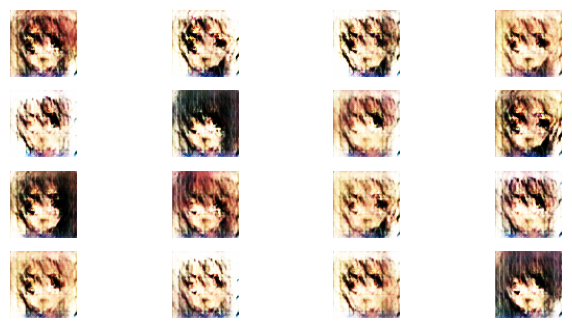

 10%|█         | 5/50 [02:31<18:25, 24.57s/it]

Time for epoch 5 is 19.19259762763977 sec
Training started with  epoch 6 with 497 batches..
Losses after epoch     6: generator 1.836, discriminator 0.480,               real_score 96.06%, fake_score 27.86%


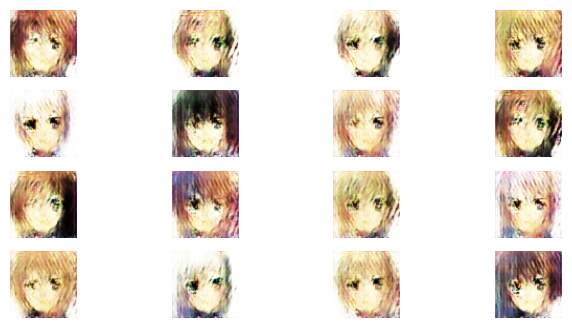

 12%|█▏        | 6/50 [02:52<17:14, 23.51s/it]

Time for epoch 6 is 21.456119060516357 sec
Training started with  epoch 7 with 497 batches..
Losses after epoch     7: generator 2.915, discriminator 0.329,               real_score 89.54%, fake_score 13.01%


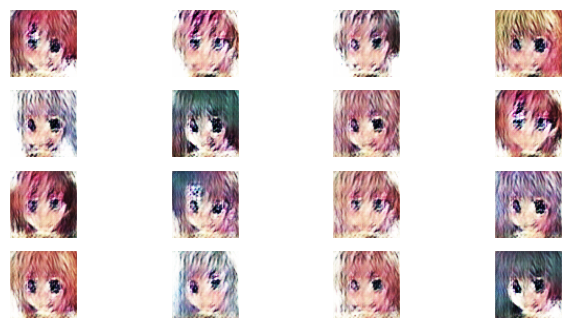

 14%|█▍        | 7/50 [03:11<15:41, 21.89s/it]

Time for epoch 7 is 18.563891410827637 sec
Training started with  epoch 8 with 497 batches..
Losses after epoch     8: generator 1.693, discriminator 0.561,               real_score 95.38%, fake_score 31.06%


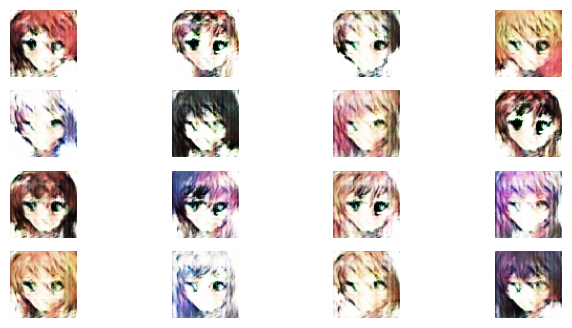

 16%|█▌        | 8/50 [03:30<14:44, 21.06s/it]

Time for epoch 8 is 19.261853218078613 sec
Training started with  epoch 9 with 497 batches..
Losses after epoch     9: generator 3.084, discriminator 0.379,               real_score 87.75%, fake_score 13.54%


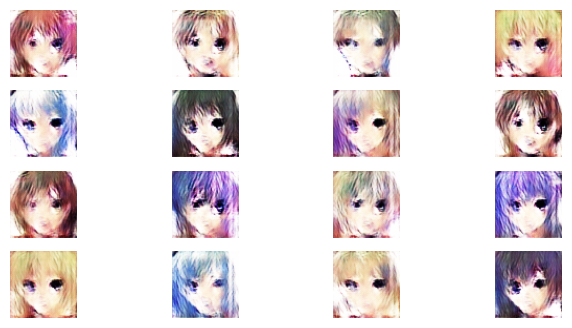

 18%|█▊        | 9/50 [03:50<14:13, 20.81s/it]

Time for epoch 9 is 20.2781662940979 sec
Training started with  epoch 10 with 497 batches..
Losses after epoch    10: generator 0.735, discriminator 1.399,               real_score 96.98%, fake_score 60.33%


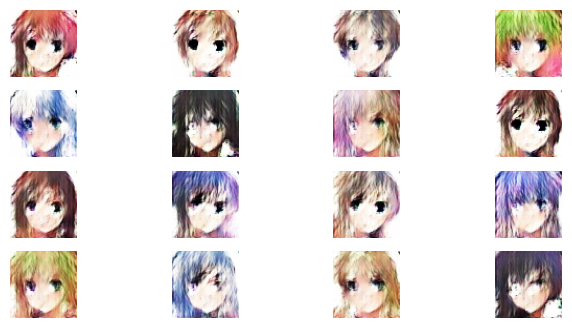

 20%|██        | 10/50 [04:09<13:28, 20.22s/it]

Time for epoch 10 is 18.877636194229126 sec
Training started with  epoch 11 with 497 batches..
Losses after epoch    11: generator 2.508, discriminator 0.356,               real_score 90.66%, fake_score 17.76%


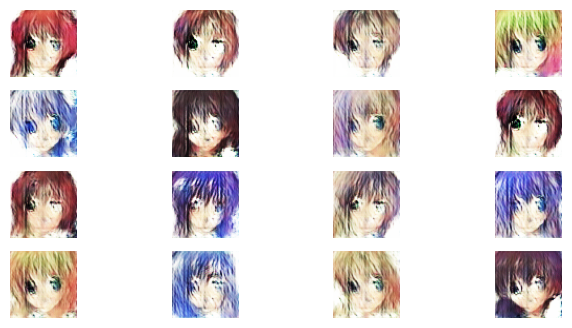

 22%|██▏       | 11/50 [04:30<13:21, 20.56s/it]

Time for epoch 11 is 21.324254035949707 sec
Training started with  epoch 12 with 497 batches..
Losses after epoch    12: generator 2.322, discriminator 0.461,               real_score 90.74%, fake_score 22.28%


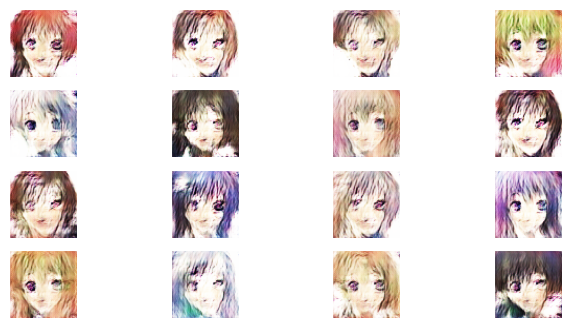

 24%|██▍       | 12/50 [04:49<12:41, 20.05s/it]

Time for epoch 12 is 18.88343572616577 sec
Training started with  epoch 13 with 497 batches..
Losses after epoch    13: generator 2.884, discriminator 0.559,               real_score 77.39%, fake_score 14.65%


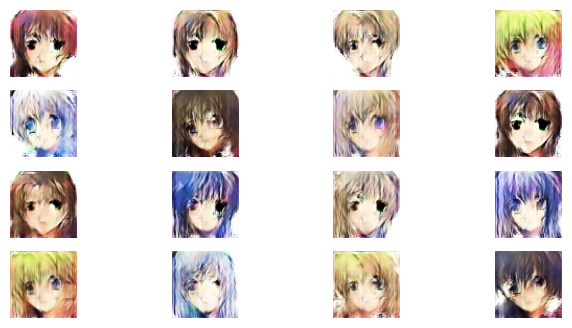

 26%|██▌       | 13/50 [05:08<12:06, 19.62s/it]

Time for epoch 13 is 18.649134397506714 sec
Training started with  epoch 14 with 497 batches..
Losses after epoch    14: generator 1.187, discriminator 0.914,               real_score 93.83%, fake_score 44.44%


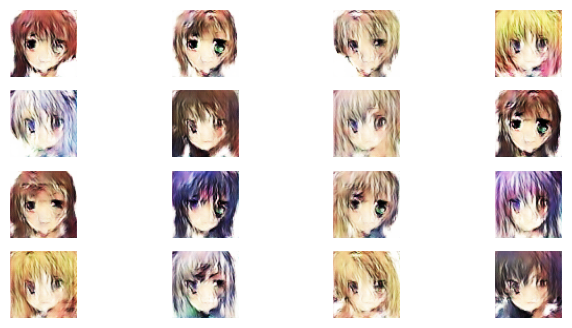

 28%|██▊       | 14/50 [05:27<11:37, 19.37s/it]

Time for epoch 14 is 18.771855354309082 sec
Training started with  epoch 15 with 497 batches..
Losses after epoch    15: generator 3.360, discriminator 0.512,               real_score 77.95%, fake_score 9.63%


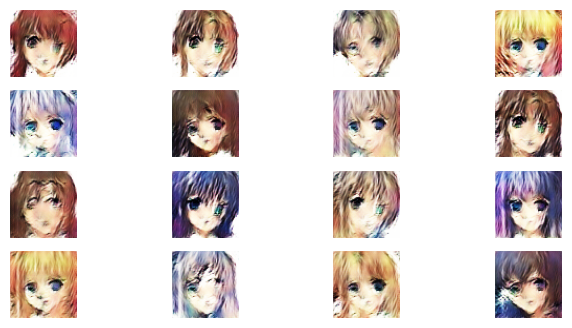

 30%|███       | 15/50 [05:47<11:32, 19.77s/it]

Time for epoch 15 is 20.711286783218384 sec
Training started with  epoch 16 with 497 batches..
Losses after epoch    16: generator 3.688, discriminator 0.725,               real_score 63.47%, fake_score 6.21%


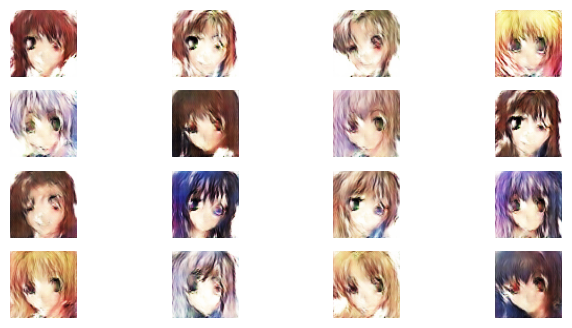

 32%|███▏      | 16/50 [06:07<11:08, 19.66s/it]

Time for epoch 16 is 19.396219730377197 sec
Training started with  epoch 17 with 497 batches..
Losses after epoch    17: generator 4.270, discriminator 0.705,               real_score 64.72%, fake_score 4.93%


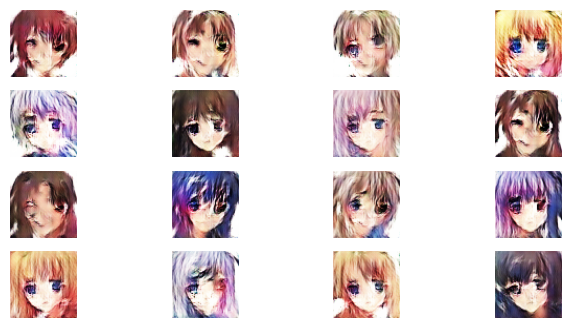

 34%|███▍      | 17/50 [06:26<10:49, 19.67s/it]

Time for epoch 17 is 19.700095415115356 sec
Training started with  epoch 18 with 497 batches..
Losses after epoch    18: generator 3.624, discriminator 0.412,               real_score 80.34%, fake_score 7.87%


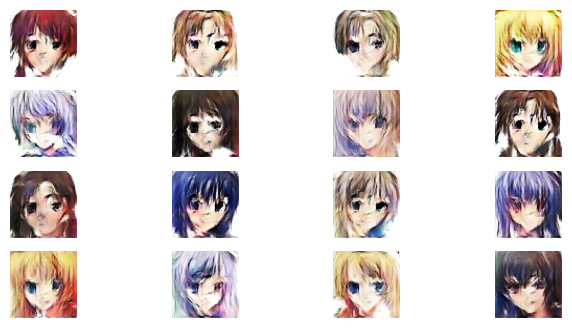

 36%|███▌      | 18/50 [06:46<10:29, 19.66s/it]

Time for epoch 18 is 19.64415693283081 sec
Training started with  epoch 19 with 497 batches..
Losses after epoch    19: generator 1.695, discriminator 0.583,               real_score 93.42%, fake_score 31.38%


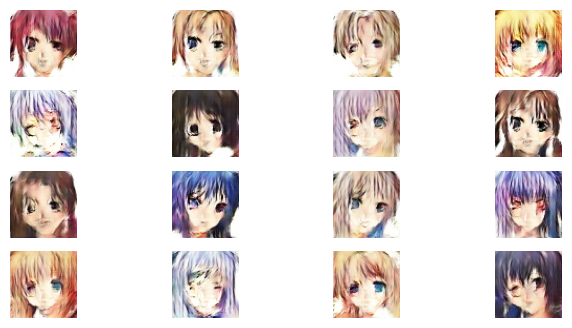

 38%|███▊      | 19/50 [07:04<09:58, 19.30s/it]

Time for epoch 19 is 18.45037317276001 sec
Training started with  epoch 20 with 497 batches..
Losses after epoch    20: generator 0.737, discriminator 1.322,               real_score 99.16%, fake_score 59.25%


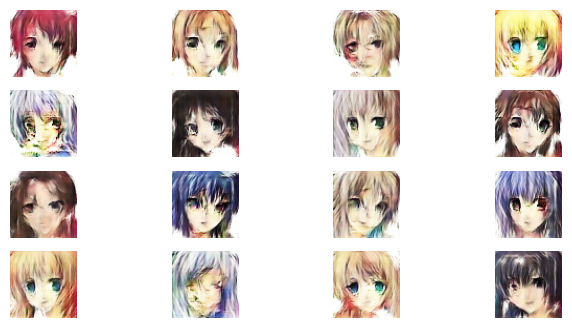

 40%|████      | 20/50 [07:23<09:35, 19.20s/it]

Time for epoch 20 is 18.963488817214966 sec
Training started with  epoch 21 with 497 batches..
Losses after epoch    21: generator 5.364, discriminator 0.425,               real_score 73.55%, fake_score 1.45%


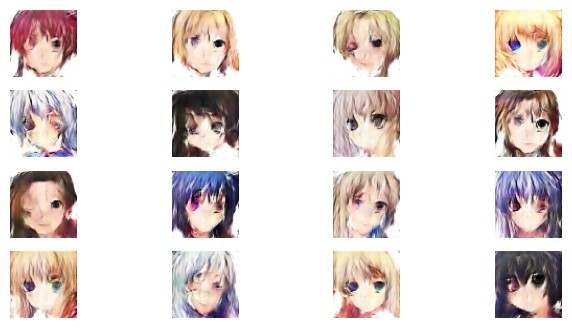

 42%|████▏     | 21/50 [07:43<09:18, 19.26s/it]

Time for epoch 21 is 19.408121347427368 sec
Training started with  epoch 22 with 497 batches..
Losses after epoch    22: generator 2.248, discriminator 0.400,               real_score 90.52%, fake_score 19.48%


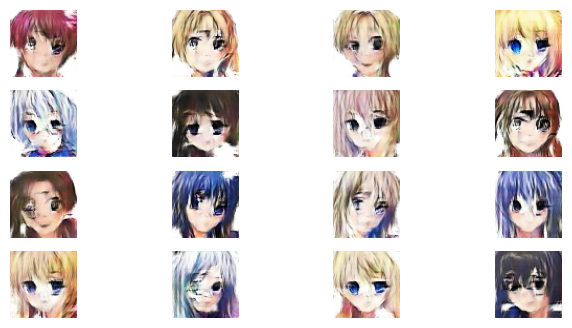

 44%|████▍     | 22/50 [08:03<09:07, 19.56s/it]

Time for epoch 22 is 20.247026681900024 sec
Training started with  epoch 23 with 497 batches..
Losses after epoch    23: generator 3.206, discriminator 0.505,               real_score 75.11%, fake_score 10.31%


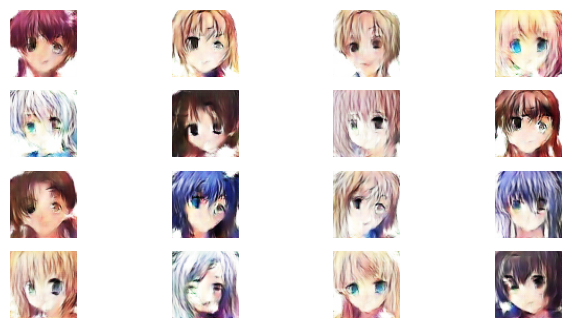

 46%|████▌     | 23/50 [08:22<08:43, 19.38s/it]

Time for epoch 23 is 18.94830322265625 sec
Training started with  epoch 24 with 497 batches..
Losses after epoch    24: generator 3.208, discriminator 0.353,               real_score 84.75%, fake_score 10.92%


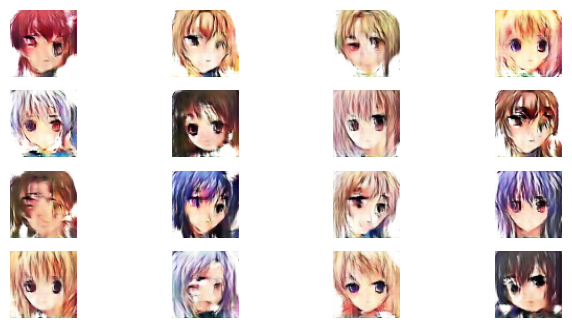

 48%|████▊     | 24/50 [08:41<08:20, 19.25s/it]

Time for epoch 24 is 18.952314853668213 sec
Training started with  epoch 25 with 497 batches..
Losses after epoch    25: generator 2.487, discriminator 0.340,               real_score 88.77%, fake_score 16.23%


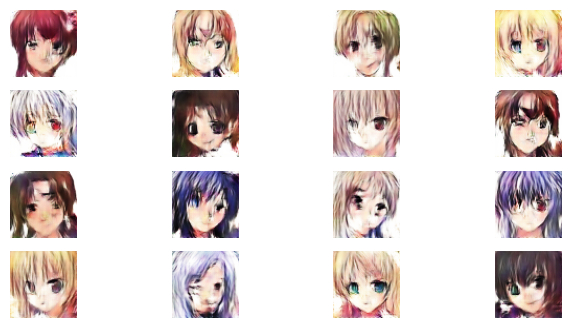

 50%|█████     | 25/50 [09:01<08:05, 19.40s/it]

Time for epoch 25 is 19.754156351089478 sec
Training started with  epoch 26 with 497 batches..
Losses after epoch    26: generator 2.228, discriminator 0.503,               real_score 86.81%, fake_score 21.82%


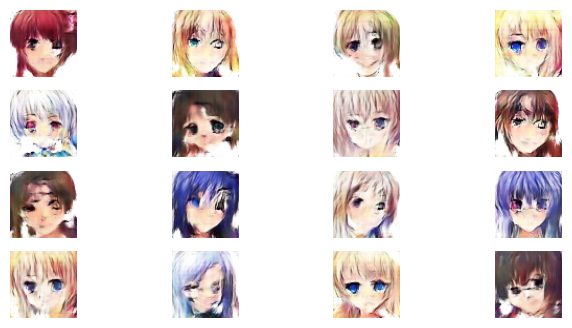

 52%|█████▏    | 26/50 [09:19<07:40, 19.20s/it]

Time for epoch 26 is 18.715336561203003 sec
Training started with  epoch 27 with 497 batches..
Losses after epoch    27: generator 2.951, discriminator 0.416,               real_score 82.03%, fake_score 12.49%


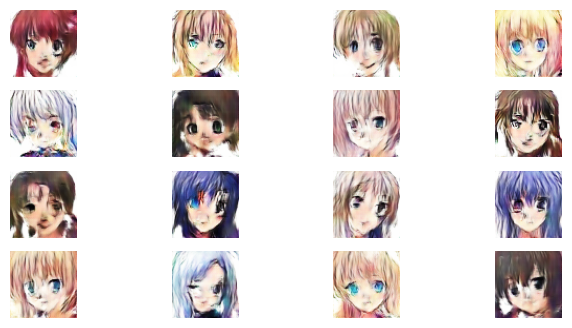

 54%|█████▍    | 27/50 [09:38<07:17, 19.02s/it]

Time for epoch 27 is 18.615792989730835 sec
Training started with  epoch 28 with 497 batches..
Losses after epoch    28: generator 2.961, discriminator 0.366,               real_score 83.46%, fake_score 11.58%


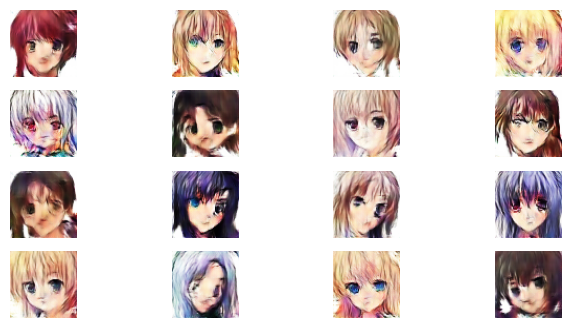

 56%|█████▌    | 28/50 [09:57<06:56, 18.94s/it]

Time for epoch 28 is 18.75361180305481 sec
Training started with  epoch 29 with 497 batches..
Losses after epoch    29: generator 2.404, discriminator 0.457,               real_score 84.37%, fake_score 17.69%


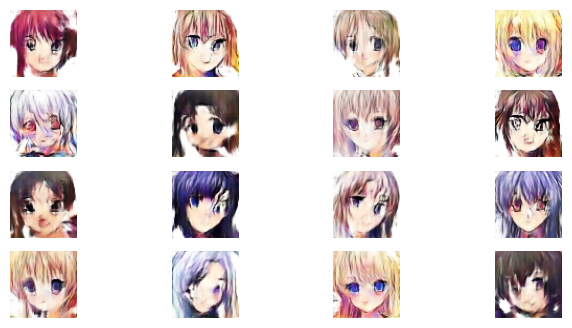

 58%|█████▊    | 29/50 [10:17<06:45, 19.29s/it]

Time for epoch 29 is 20.104767322540283 sec
Training started with  epoch 30 with 497 batches..
Losses after epoch    30: generator 2.710, discriminator 0.319,               real_score 93.32%, fake_score 17.39%


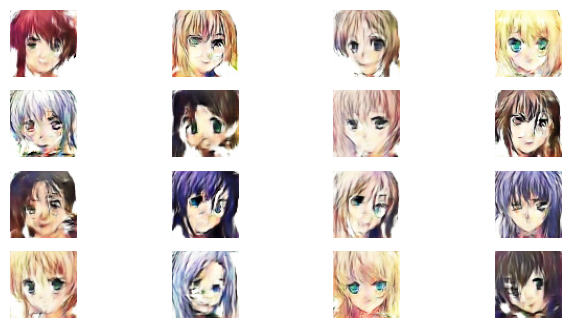

 60%|██████    | 30/50 [10:37<06:29, 19.45s/it]

Time for epoch 30 is 19.824623107910156 sec
Training started with  epoch 31 with 497 batches..
Losses after epoch    31: generator 2.544, discriminator 1.267,               real_score 50.23%, fake_score 18.07%


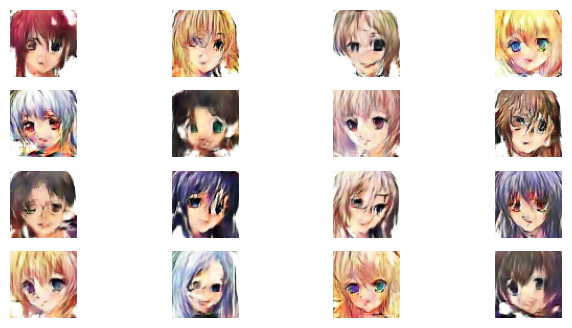

 62%|██████▏   | 31/50 [10:58<06:17, 19.88s/it]

Time for epoch 31 is 20.87146234512329 sec
Training started with  epoch 32 with 497 batches..
Losses after epoch    32: generator 2.967, discriminator 0.679,               real_score 67.08%, fake_score 12.67%


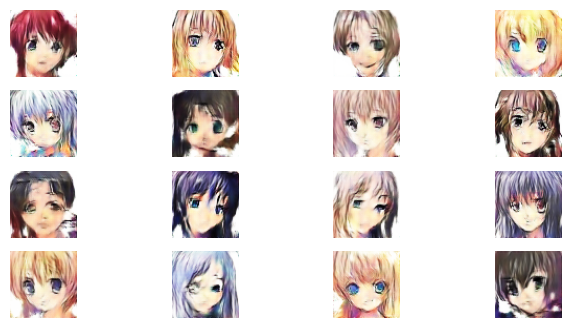

 64%|██████▍   | 32/50 [11:17<05:53, 19.65s/it]

Time for epoch 32 is 19.121861457824707 sec
Training started with  epoch 33 with 497 batches..
Losses after epoch    33: generator 0.960, discriminator 1.071,               real_score 98.16%, fake_score 51.46%


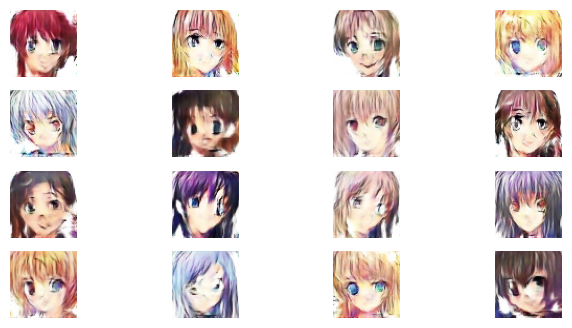

 66%|██████▌   | 33/50 [11:38<05:43, 20.19s/it]

Time for epoch 33 is 21.436940670013428 sec
Training started with  epoch 34 with 497 batches..
Losses after epoch    34: generator 3.543, discriminator 0.275,               real_score 87.78%, fake_score 7.77%


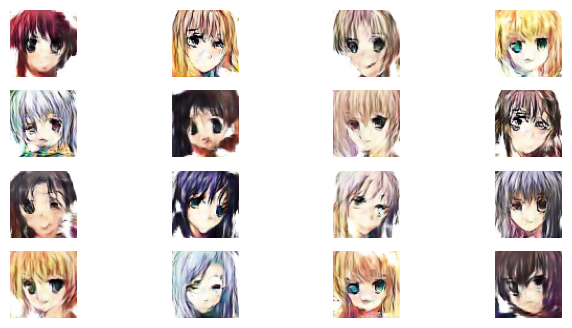

 68%|██████▊   | 34/50 [11:59<05:24, 20.27s/it]

Time for epoch 34 is 20.446518659591675 sec
Training started with  epoch 35 with 497 batches..
Losses after epoch    35: generator 2.154, discriminator 0.410,               real_score 92.86%, fake_score 22.62%


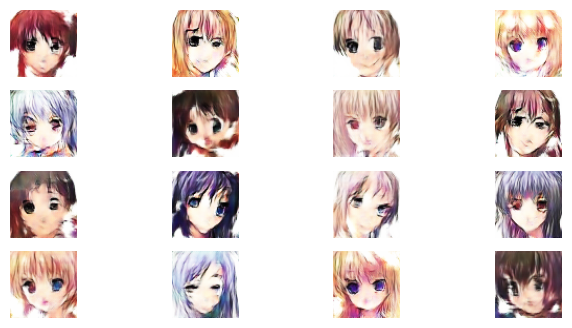

 70%|███████   | 35/50 [12:21<05:11, 20.74s/it]

Time for epoch 35 is 21.86059069633484 sec
Training started with  epoch 36 with 497 batches..
Losses after epoch    36: generator 3.360, discriminator 0.452,               real_score 76.99%, fake_score 8.97%


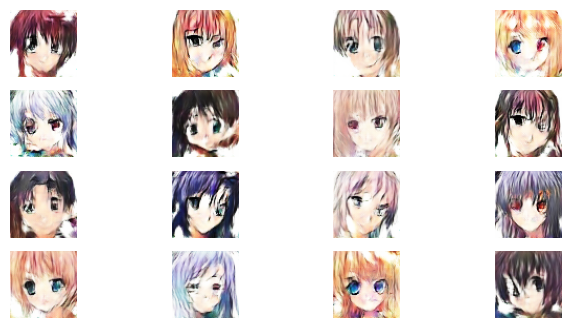

 72%|███████▏  | 36/50 [12:40<04:44, 20.29s/it]

Time for epoch 36 is 19.220456838607788 sec
Training started with  epoch 37 with 497 batches..
Losses after epoch    37: generator 3.153, discriminator 0.194,               real_score 95.73%, fake_score 11.70%


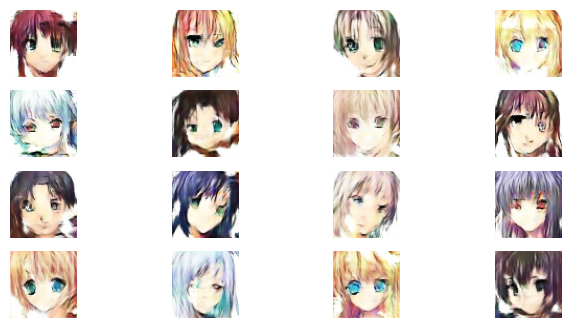

 74%|███████▍  | 37/50 [12:58<04:16, 19.73s/it]

Time for epoch 37 is 18.41930890083313 sec
Training started with  epoch 38 with 497 batches..
Losses after epoch    38: generator 2.471, discriminator 0.305,               real_score 96.86%, fake_score 19.14%


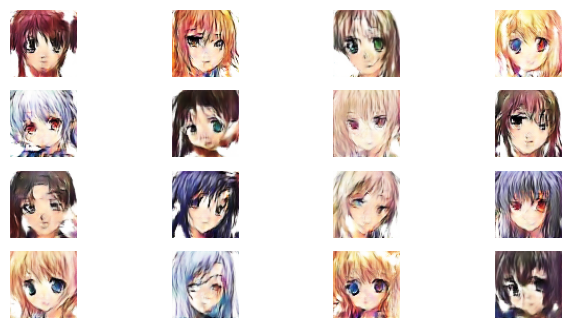

 76%|███████▌  | 38/50 [13:17<03:53, 19.46s/it]

Time for epoch 38 is 18.842536211013794 sec
Training started with  epoch 39 with 497 batches..
Losses after epoch    39: generator 2.280, discriminator 0.529,               real_score 87.42%, fake_score 22.25%


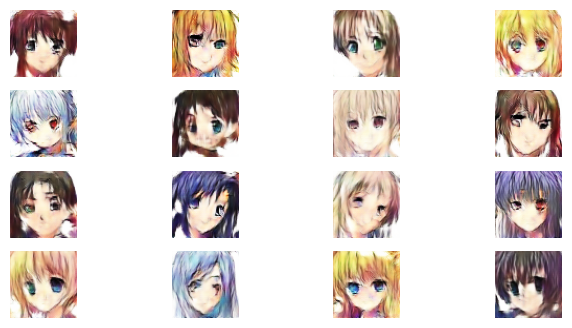

 78%|███████▊  | 39/50 [13:36<03:32, 19.29s/it]

Time for epoch 39 is 18.884037733078003 sec
Training started with  epoch 40 with 497 batches..
Losses after epoch    40: generator 3.287, discriminator 0.239,               real_score 90.88%, fake_score 10.24%


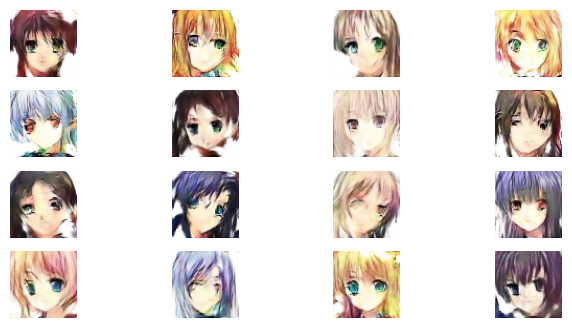

 80%|████████  | 40/50 [13:55<03:12, 19.23s/it]

Time for epoch 40 is 19.100303888320923 sec
Training started with  epoch 41 with 497 batches..
Losses after epoch    41: generator 2.484, discriminator 0.304,               real_score 94.93%, fake_score 18.00%


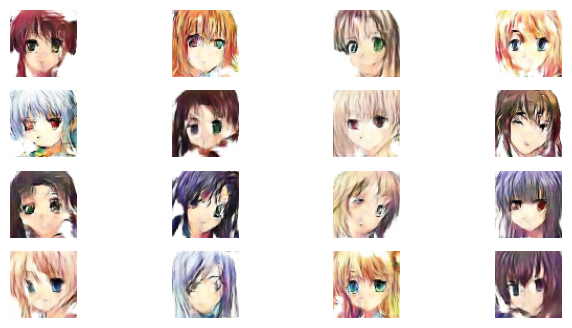

 82%|████████▏ | 41/50 [14:14<02:53, 19.28s/it]

Time for epoch 41 is 19.400248050689697 sec
Training started with  epoch 42 with 497 batches..
Losses after epoch    42: generator 3.130, discriminator 0.354,               real_score 86.56%, fake_score 12.83%


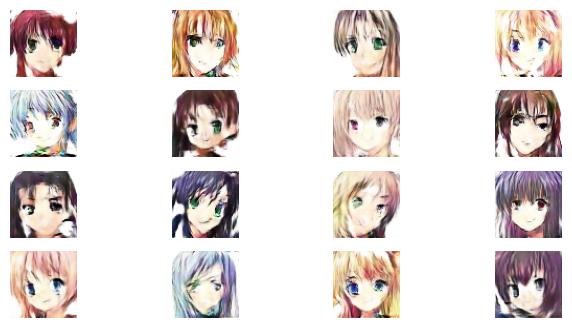

 84%|████████▍ | 42/50 [14:34<02:36, 19.52s/it]

Time for epoch 42 is 20.078630924224854 sec
Training started with  epoch 43 with 497 batches..
Losses after epoch    43: generator 1.424, discriminator 0.690,               real_score 96.75%, fake_score 38.49%


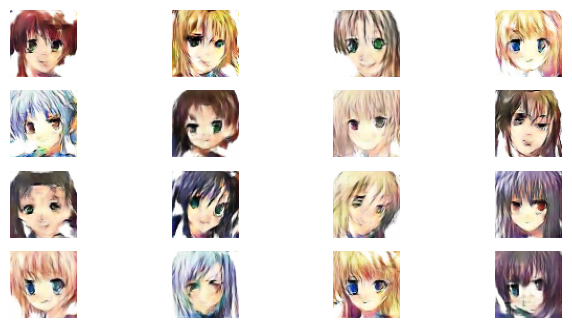

 86%|████████▌ | 43/50 [14:53<02:14, 19.28s/it]

Time for epoch 43 is 18.697805643081665 sec
Training started with  epoch 44 with 497 batches..
Losses after epoch    44: generator 2.697, discriminator 0.439,               real_score 85.56%, fake_score 16.38%


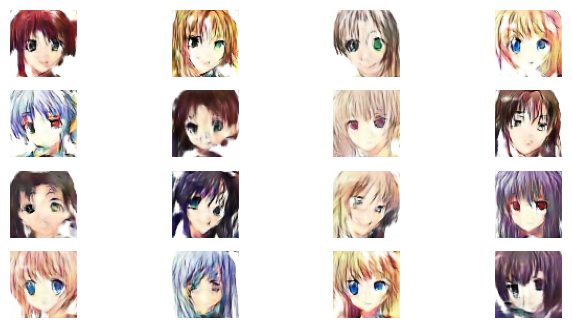

 88%|████████▊ | 44/50 [15:12<01:54, 19.07s/it]

Time for epoch 44 is 18.590683221817017 sec
Training started with  epoch 45 with 497 batches..
Losses after epoch    45: generator 4.722, discriminator 0.941,               real_score 54.88%, fake_score 3.21%


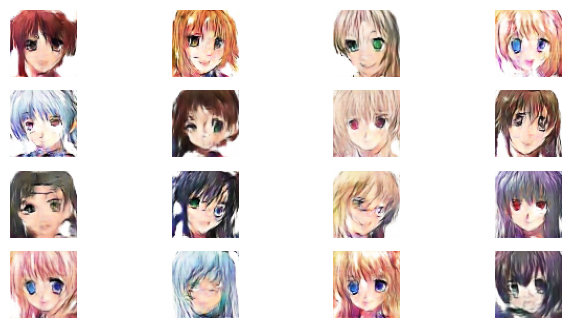

 90%|█████████ | 45/50 [15:30<01:33, 18.77s/it]

Time for epoch 45 is 18.059178113937378 sec
Training started with  epoch 46 with 497 batches..
Losses after epoch    46: generator 3.434, discriminator 0.348,               real_score 83.07%, fake_score 9.30%


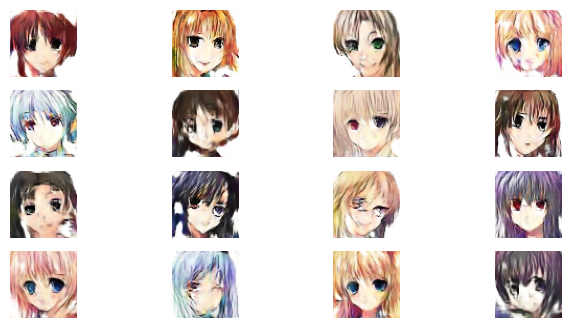

 92%|█████████▏| 46/50 [15:49<01:15, 18.95s/it]

Time for epoch 46 is 19.376631259918213 sec
Training started with  epoch 47 with 497 batches..
Losses after epoch    47: generator 4.240, discriminator 0.258,               real_score 83.62%, fake_score 3.82%


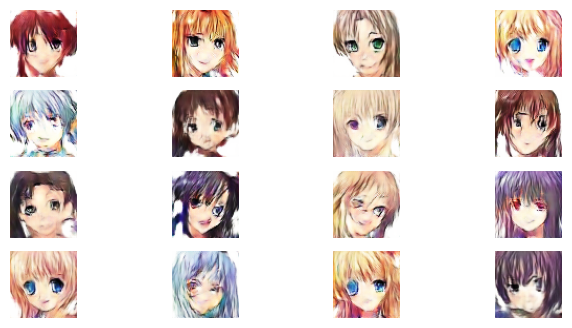

 94%|█████████▍| 47/50 [16:07<00:56, 18.74s/it]

Time for epoch 47 is 18.235353708267212 sec
Training started with  epoch 48 with 497 batches..
Losses after epoch    48: generator 4.232, discriminator 0.268,               real_score 88.19%, fake_score 5.68%


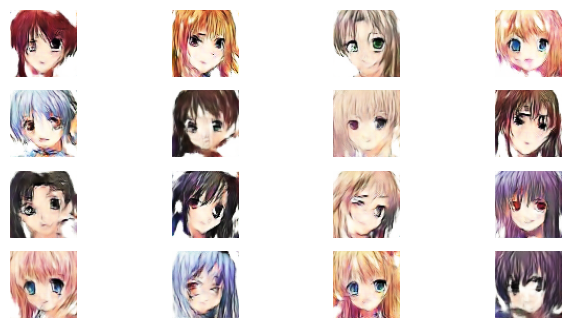

 96%|█████████▌| 48/50 [16:25<00:36, 18.32s/it]

Time for epoch 48 is 17.345617055892944 sec
Training started with  epoch 49 with 497 batches..
Losses after epoch    49: generator 4.001, discriminator 0.175,               real_score 92.07%, fake_score 5.87%


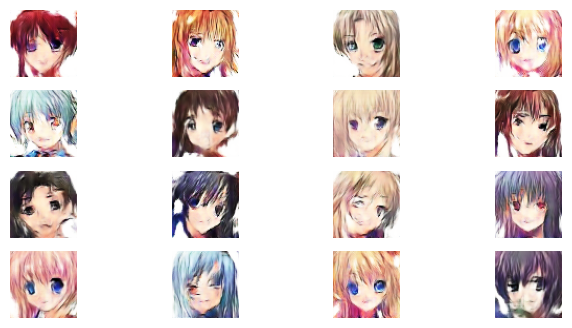

 98%|█████████▊| 49/50 [16:45<00:18, 18.84s/it]

Time for epoch 49 is 20.064995765686035 sec
Training started with  epoch 50 with 497 batches..
Losses after epoch    50: generator 3.754, discriminator 0.229,               real_score 89.53%, fake_score 7.26%


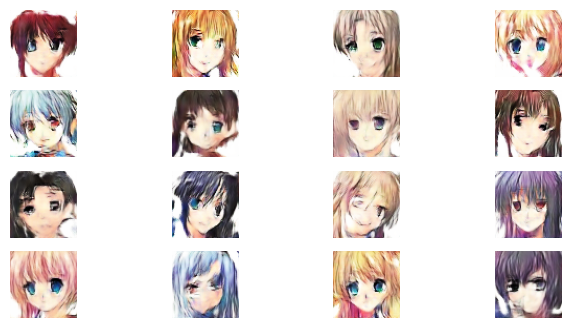

100%|██████████| 50/50 [17:04<00:00, 20.48s/it]

Time for epoch 50 is 18.714202642440796 sec


In [31]:
gen_loss_epochs, disc_loss_epochs, real_score_list, fake_score_list = train(train_dataset, epochs = epochs)

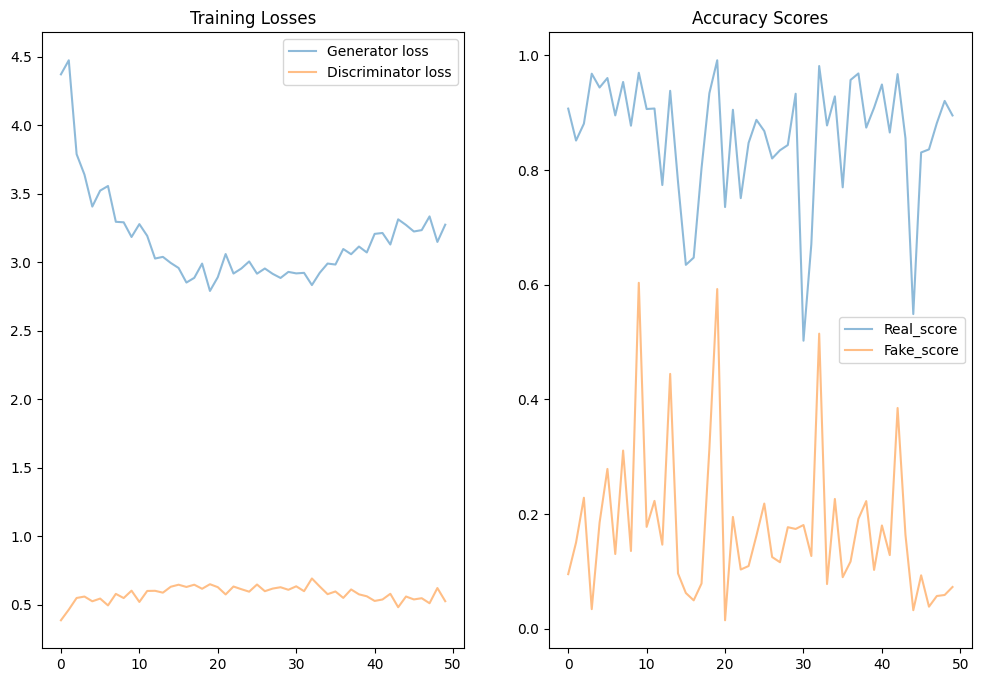

In [34]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize = (12, 8))

ax1.plot(gen_loss_epochs, label = 'Generator loss', alpha = 0.5)
ax1.plot(disc_loss_epochs, label = 'Discriminator loss', alpha = 0.5)
ax1.legend()
ax1.set_title('Training Losses')

ax2.plot(real_score_list, label = 'Real_score', alpha = 0.5)
ax2.plot(fake_score_list, label = 'Fake_score', alpha = 0.5)
ax2.set_title('Accuracy Scores')
ax2.legend()